In [1]:
import pyaudio
import struct
import matplotlib.pyplot as plt
import numpy as np
from scipy import signal

In [2]:
mic = pyaudio.PyAudio()

FORMAT = pyaudio.paInt16 
CHANNELS = 1 
RATE = 48000 
INTERVAL = 0.32 
CHUNK = int(RATE * INTERVAL) 

In [3]:
stream = mic.open(format=FORMAT, channels=CHANNELS, rate=RATE, 
            input=True, output=True, frames_per_buffer=CHUNK)

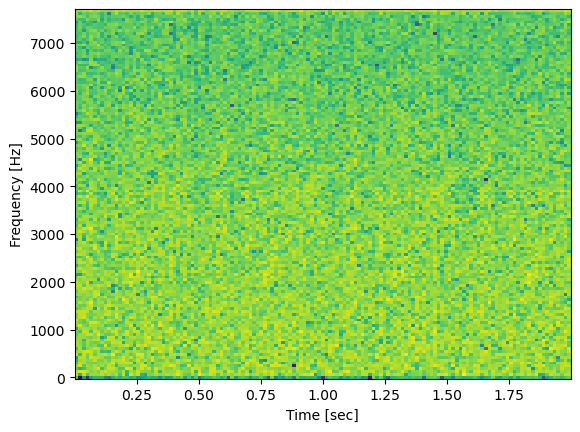

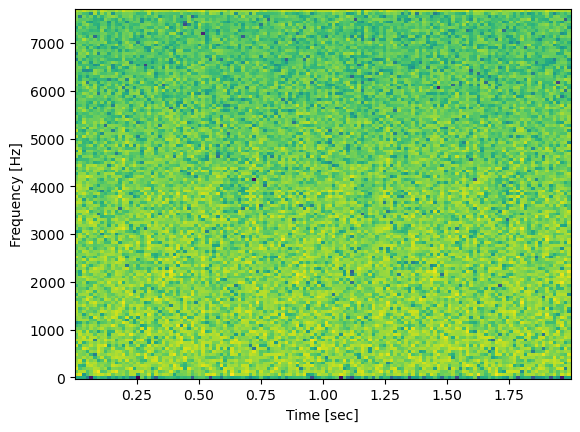

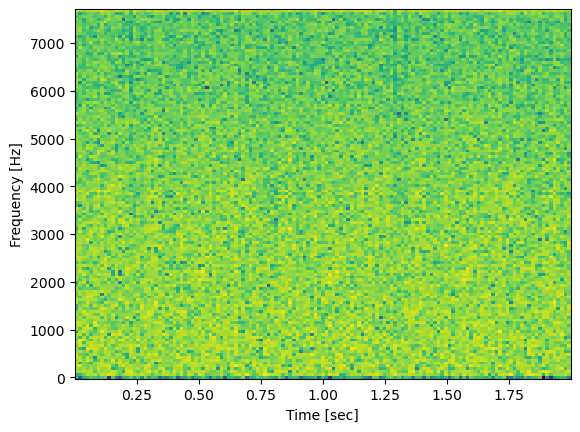

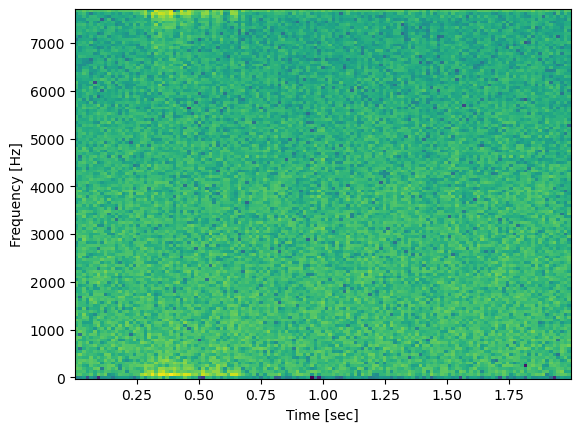

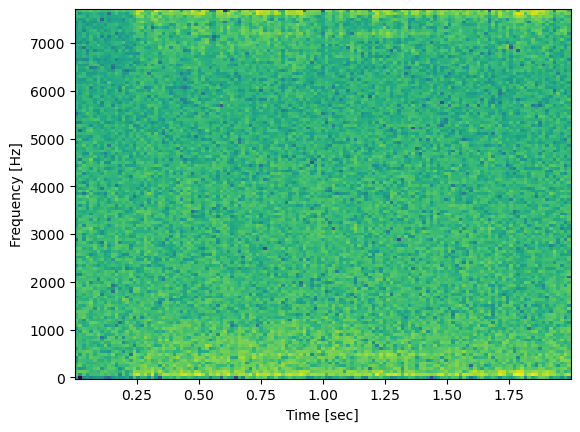

...

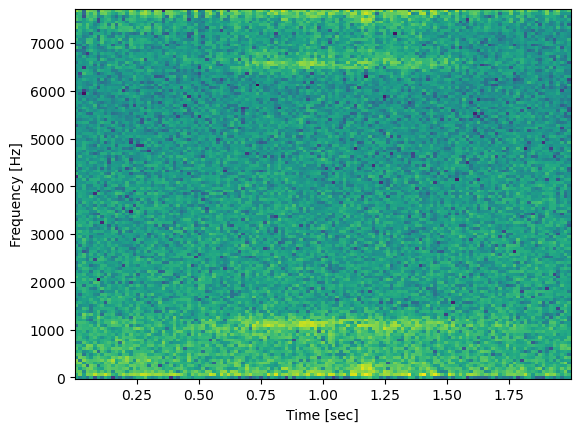

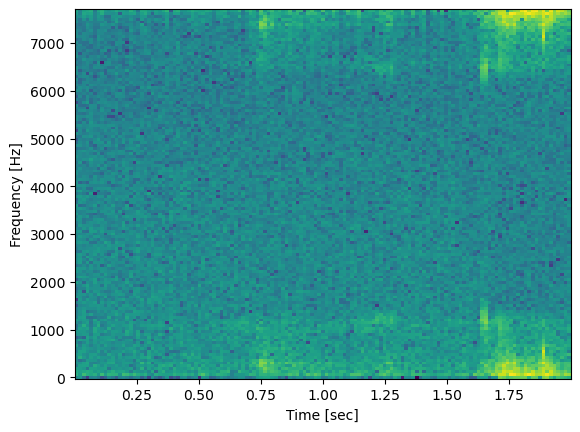

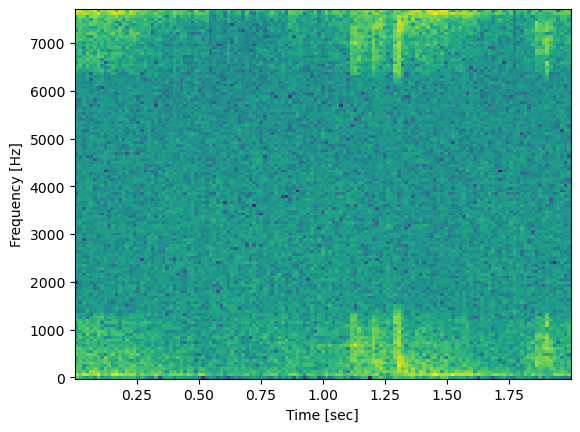

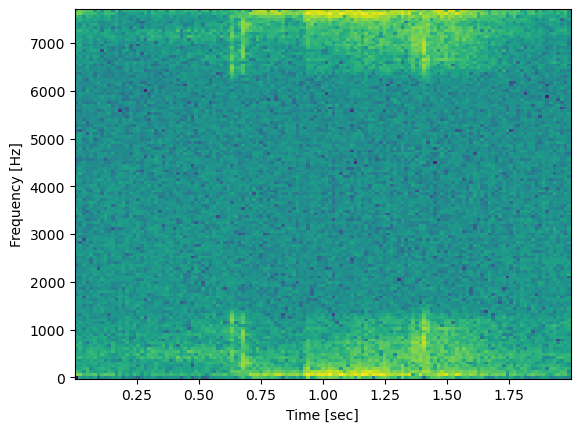

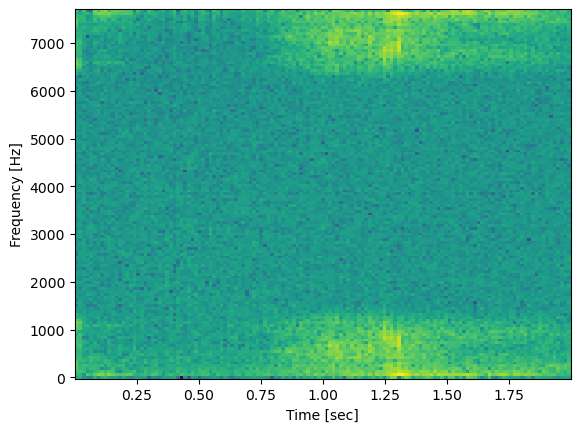

In [4]:
i=0
while i < 100: 
    data = stream.read(CHUNK, exception_on_overflow=False)
    data = np.frombuffer(data, dtype='b')
    
    f, t, Sxx = signal.spectrogram(data, fs=CHUNK)
    dBS = 10 * np.log10(Sxx)
    plt.clf()
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time [sec]')

    plt.pcolormesh(t, f, dBS)
    plt.pause(0.001)
    i+=1

In [5]:
stream.stop_stream()
stream.close()
mic.terminate()